In [1]:
import skimage.io as io
import numpy as np
import matplotlib.pyplot as plt
import glob
from skimage.color import rgb2gray
from skimage.filters import gaussian
from skimage.util import random_noise
from skimage.feature import canny
from skimage import exposure
from skimage.measure import find_contours
import cv2
import imutils
import pytesseract

In [2]:
def show_images(images, titles=None):
    # This function is used to show image(s) with titles by sending an array of images and an array of associated titles.
    # images[0] will be drawn with the title titles[0] if exists
    # You aren't required to understand this function, use it as-is.
    n_ims = len(images)
    if titles is None:
        titles = ['(%d)' % i for i in range(1, n_ims + 1)]
    fig = plt.figure()
    n = 1
    for image, title in zip(images, titles):
        a = fig.add_subplot(1, n_ims, n)
        if image.ndim == 2:
            plt.gray()
        plt.imshow(image)
        a.set_title(title)
        n += 1
    fig.set_size_inches(np.array(fig.get_size_inches()) * n_ims)
    plt.show()

In [3]:
'''
* Returns the given image filtered from noise.
*
* @param  img  a grey scale image with intensties from 0 to 1
* @return      the given image filtered from noise
'''
def noiseReduction(img):
    imgBrightness = np.mean(img)
    sigma = 1 / (2 * imgBrightness)
    imgFiltered = gaussian(img, sigma)
    return imgFiltered

In [4]:
'''
* Returns the given image after contrast enhancement.
*
* @param  img  a grey scale image with intensties from 0 to 1
* @return      the given image after contrast enhancement
'''
def contrastEnhancement(img):
    cov = np.std(img) / np.mean(img)
    if (cov < 0.5):
        imgEnhanced = exposure.equalize_hist(img)
    else:
        gamma = np.log(np.mean(img)) / np.log(0.5)
        imgEnhanced = exposure.adjust_gamma(img, gamma)
    return imgEnhanced

In [5]:
'''
* Returns the given image with characters segmented.
*
* @param  img     a grey scale image with intensties from 0 to 1
* @param  method  method of character segmentation ("connectedComponents" or "blackHatMorphology")
* @return         the given image with characters segmented
'''
def characterSegmentation(img, method):
    if (method == "connectedComponents"):
        imgBinary = cv2.threshold(np.uint8(img * 255), 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]
        componentsCount, labels, _, _ = cv2.connectedComponentsWithStats(imgBinary, 8, cv2.CV_32S)
        characters = np.zeros(img.shape, dtype="uint8")
        for i in range(2, componentsCount):
            componentMask = np.uint8((labels == i) * 255)
            characters = cv2.bitwise_or(characters, componentMask)
    elif (method == "blackHatMorphology"):
        seBlackHat = cv2.getStructuringElement(cv2.MORPH_RECT, (13, 13))
        characters = cv2.morphologyEx(img, cv2.MORPH_BLACKHAT, seBlackHat)
    else:
        characters = img.copy()
    return characters

In [6]:
'''
* Returns the plate number.
*
* @param  original img and grey scale image with intensties from 0 to 1 and image with edges
* @return      the plate number of a car
'''
def Plate_detection(car_edge,car_gray,car_img):

    arr = np.uint8(car_edge)
    contours = cv2.findContours(arr.copy(), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    contours = imutils.grab_contours(contours)
    contours = sorted(contours, key=cv2.contourArea, reverse=True)[:10]
    location = None
    for contour in contours:
        approx = cv2.approxPolyDP(contour, 10, True)
        if len(approx) == 4:
            location = approx
            break
    Xmin = np.inf
    Xmax = 0
    Ymin = np.inf
    Ymax = 0
    if (location is None):
        return car_gray, car_img
    for i in range(len(location)):
        point = location[i]
        if(point[0][0] > Xmax):
            Xmax = point[0][0]
        if(point[0][0] < Xmin):
            Xmin = point[0][0]
        if(point[0][1] > Ymax):
            Ymax = point[0][1]
        if(point[0][1] < Ymin):
            Ymin = point[0][1]

    color = (0, 255, 0) 
    thickness = 3
    image = cv2.rectangle(car_img, (Xmin,Ymin), (Xmax,Ymax), color, thickness) 
    return car_gray[Ymin:Ymax,Xmin:Xmax],image

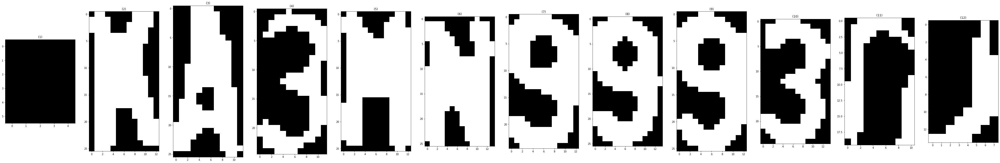

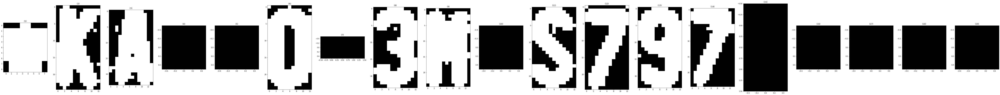

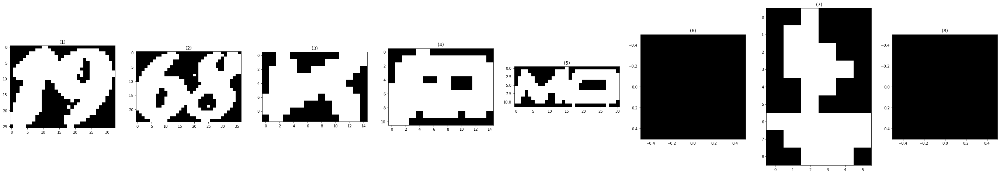

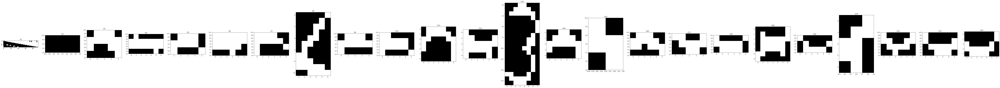

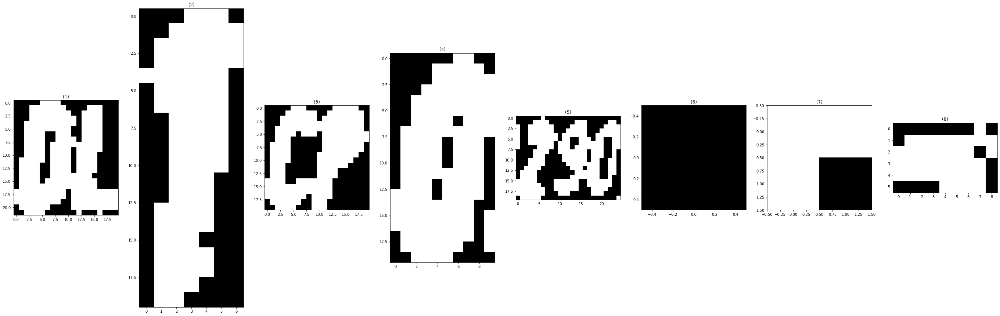

...

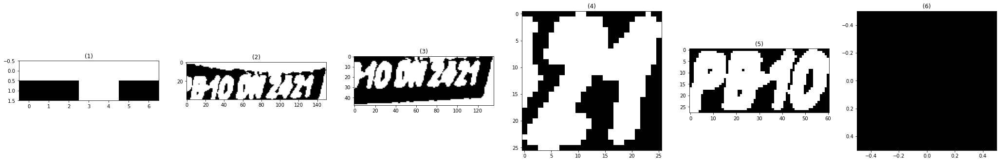

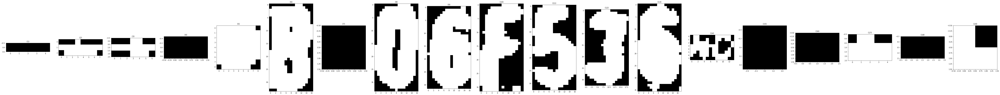

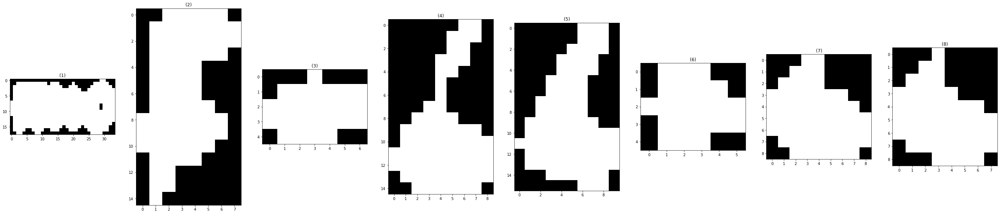

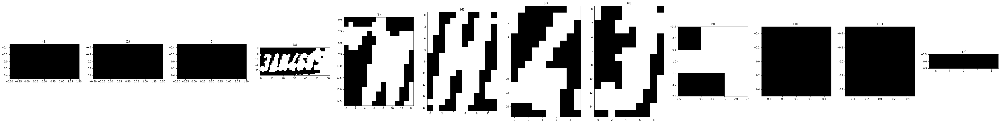

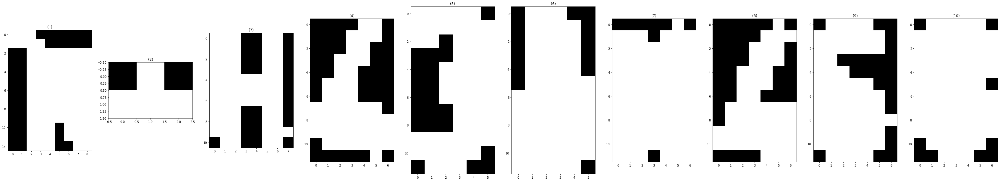

<Figure size 0x0 with 0 Axes>

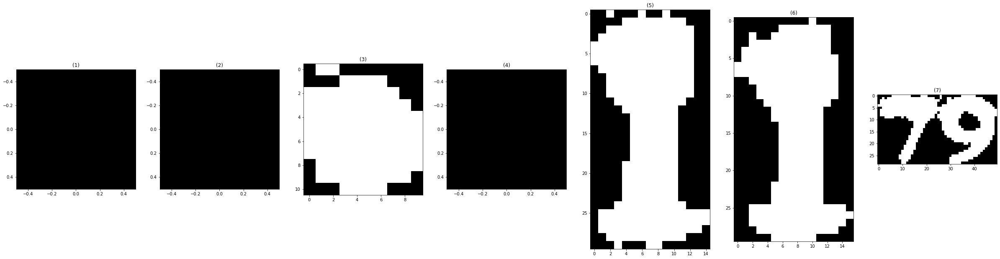

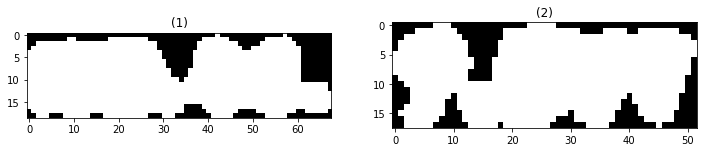

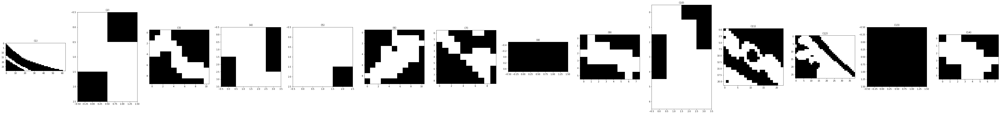

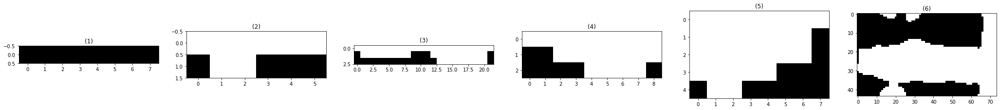

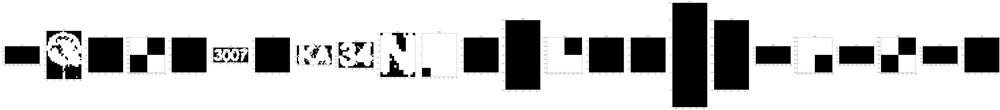

...

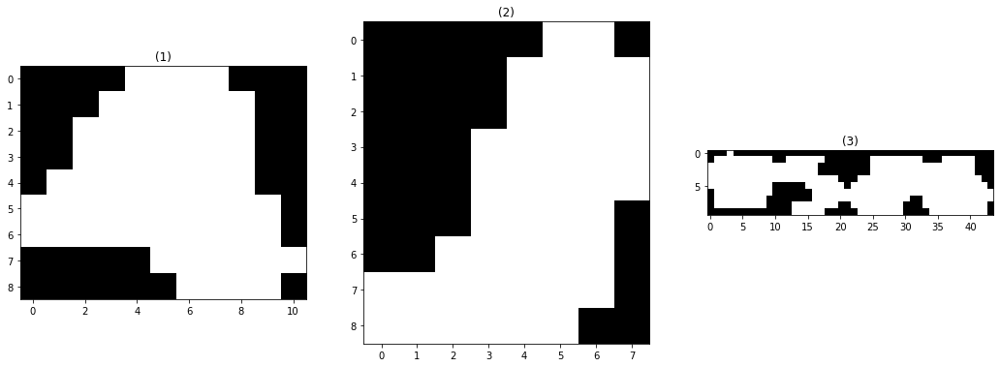

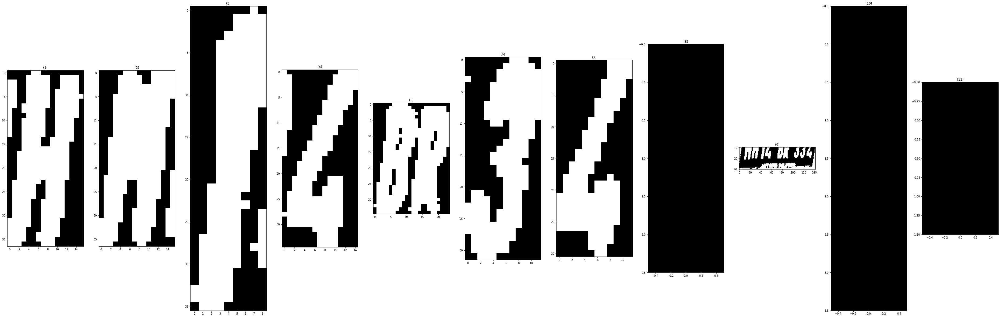

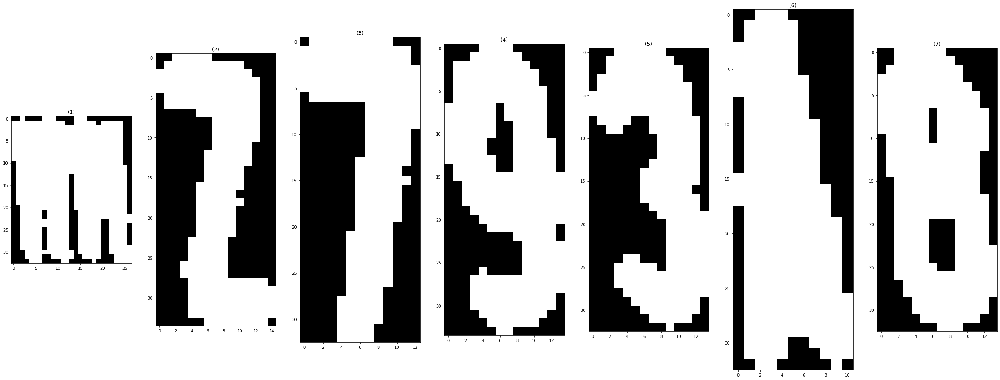

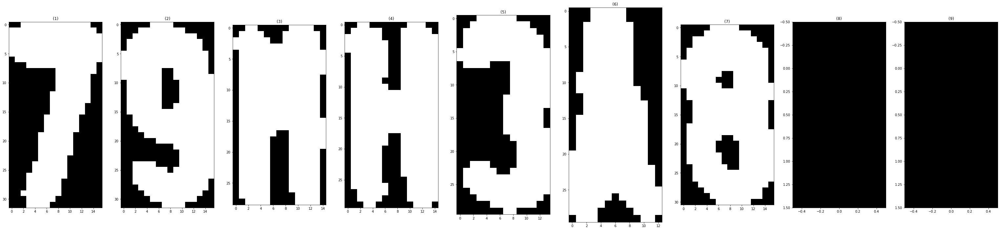

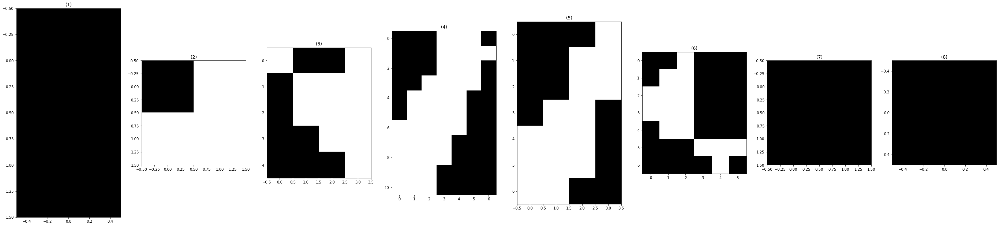

<Figure size 0x0 with 0 Axes>

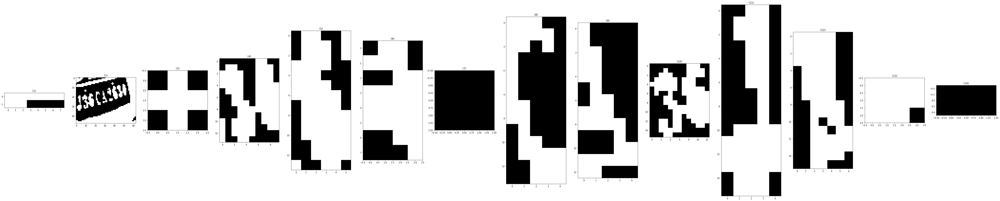

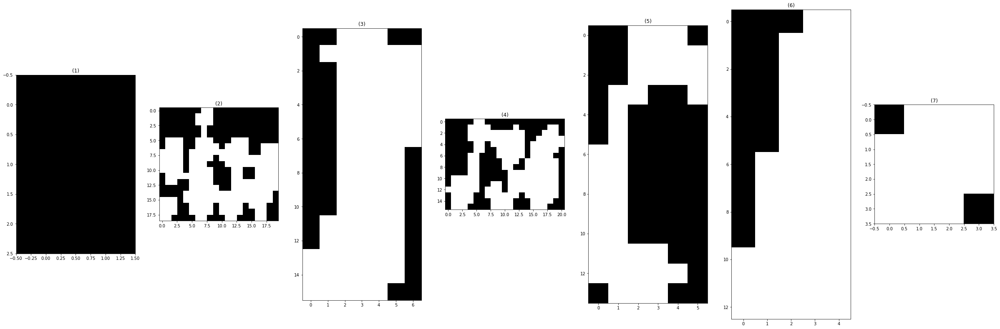

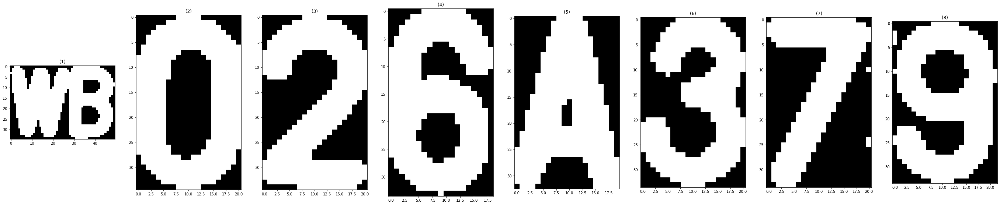

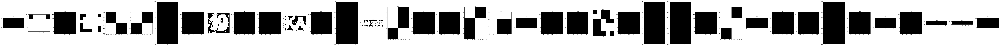

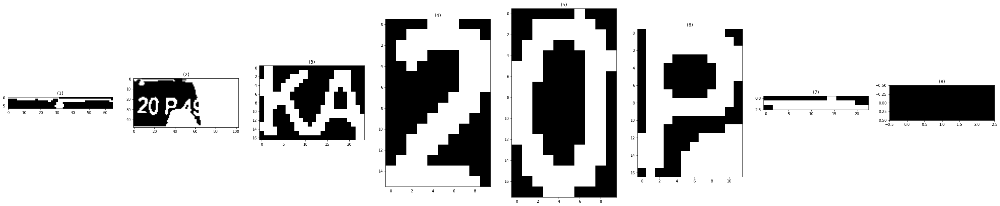

...

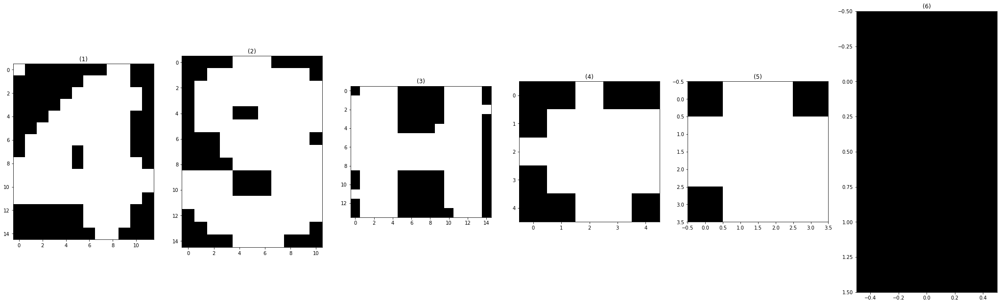

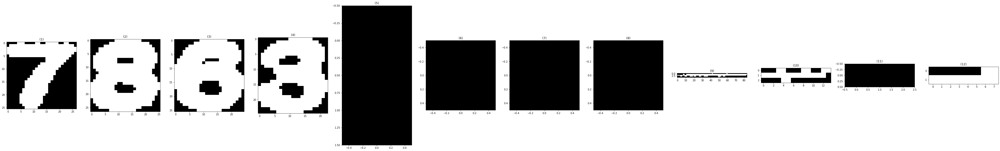

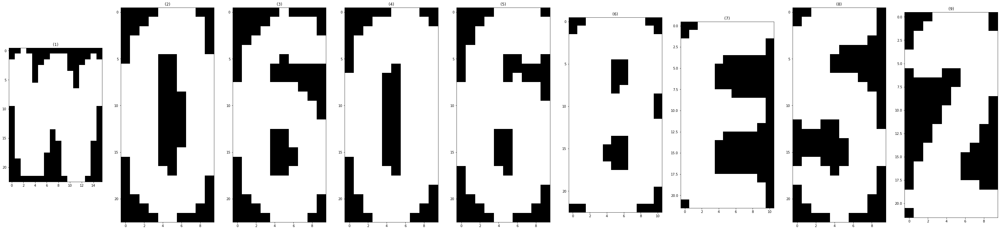

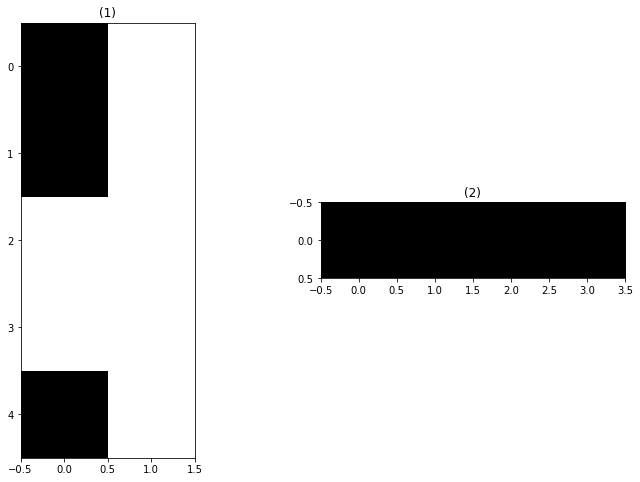

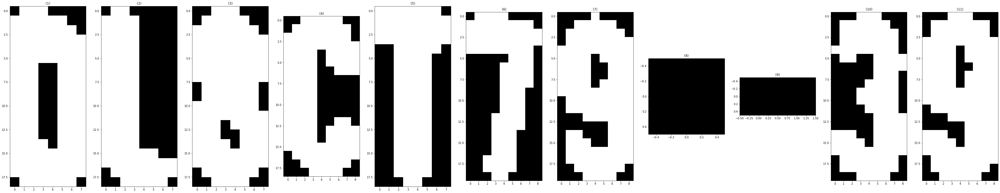

<Figure size 0x0 with 0 Axes>

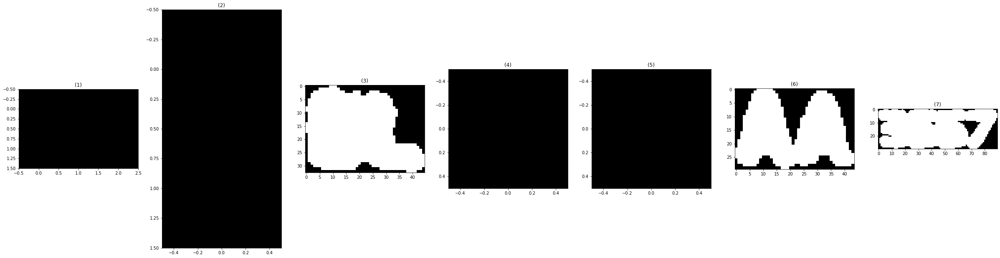

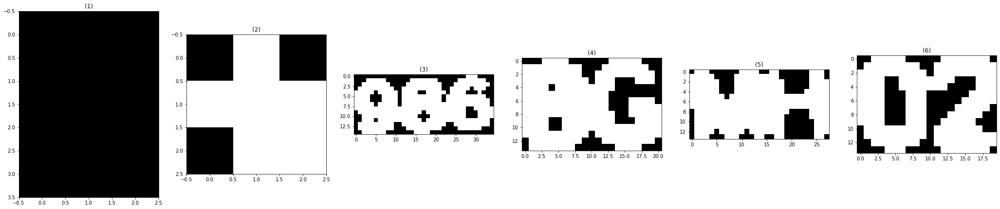

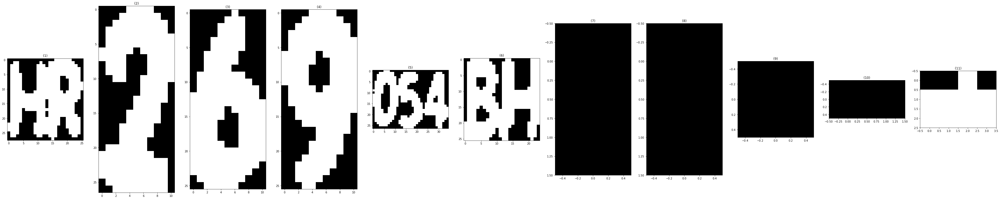

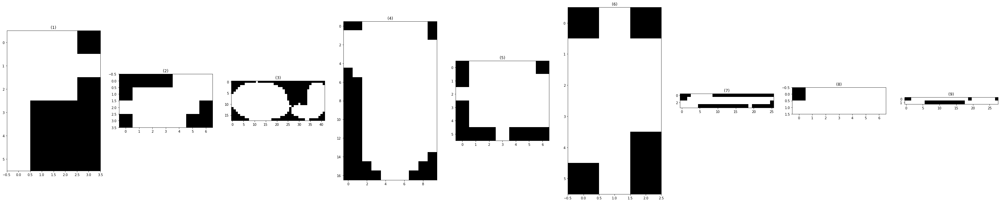

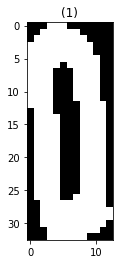

...

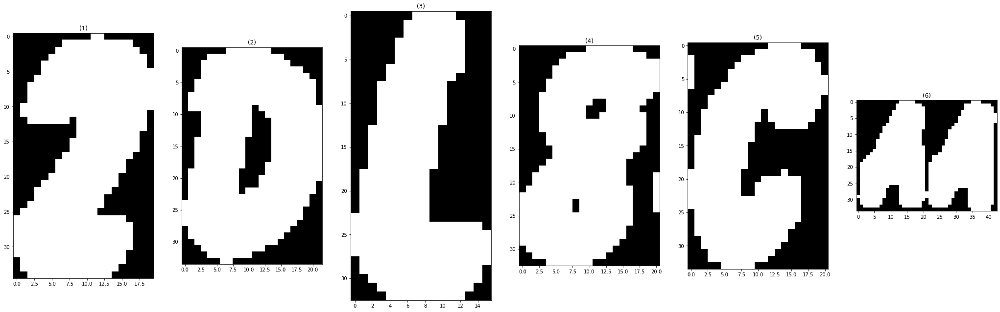

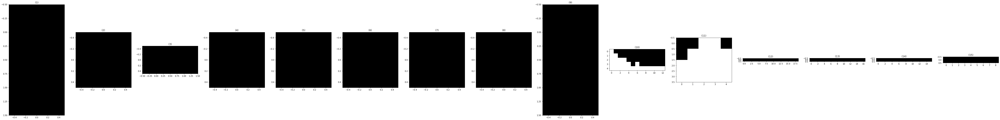

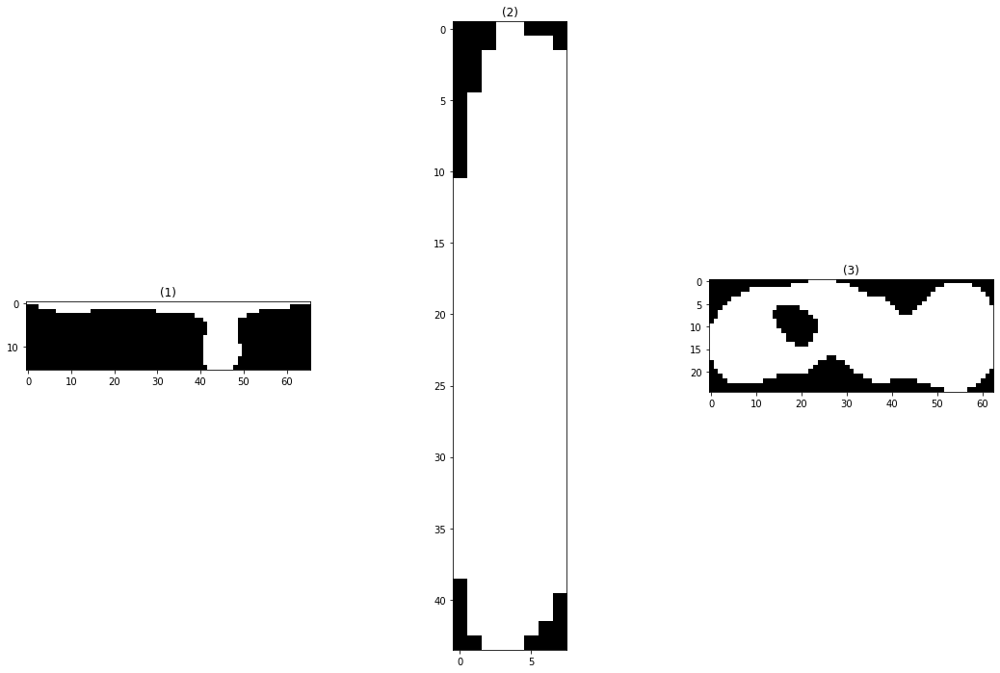

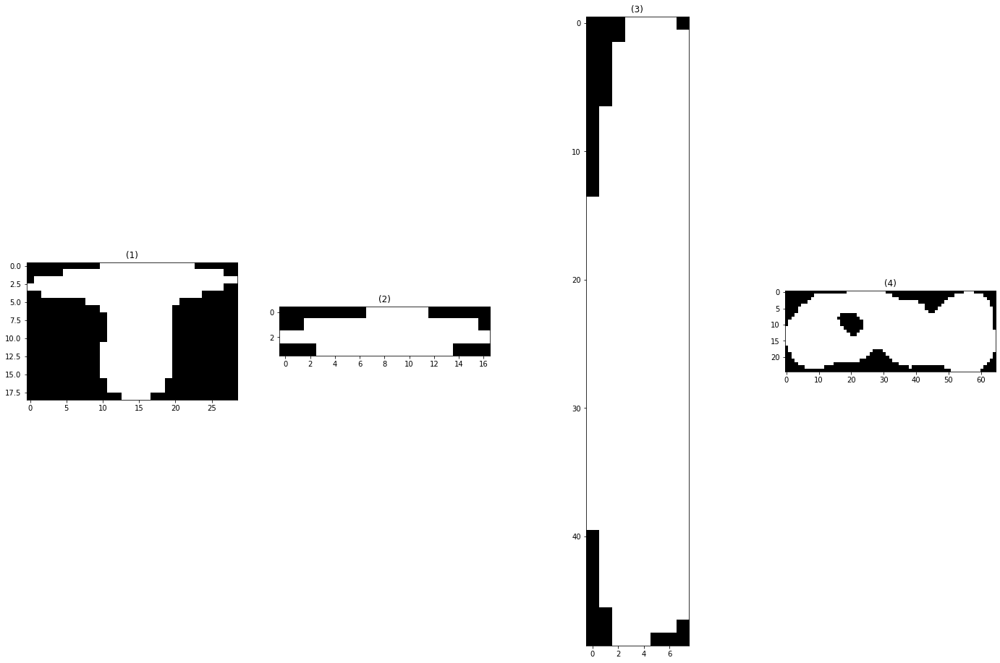

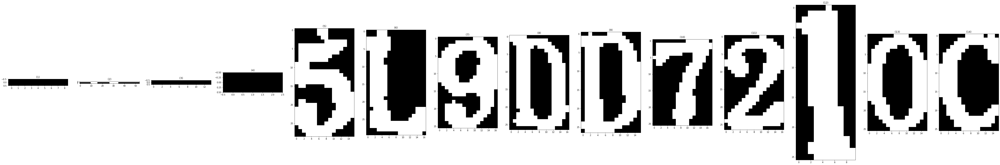

In [ ]:
for imgName in sorted(glob.glob('C:/Users/Mazen/Desktop/image/Project/indian_dataset/Indian Plates/positive/*.png')):
    image = io.imread(imgName)
    gray = np.asarray(rgb2gray(image))
    imgFiltered = noiseReduction(gray)
    imgEnhanced = contrastEnhancement(imgFiltered)
    characters = characterSegmentation(imgEnhanced)
    show_images(characters)

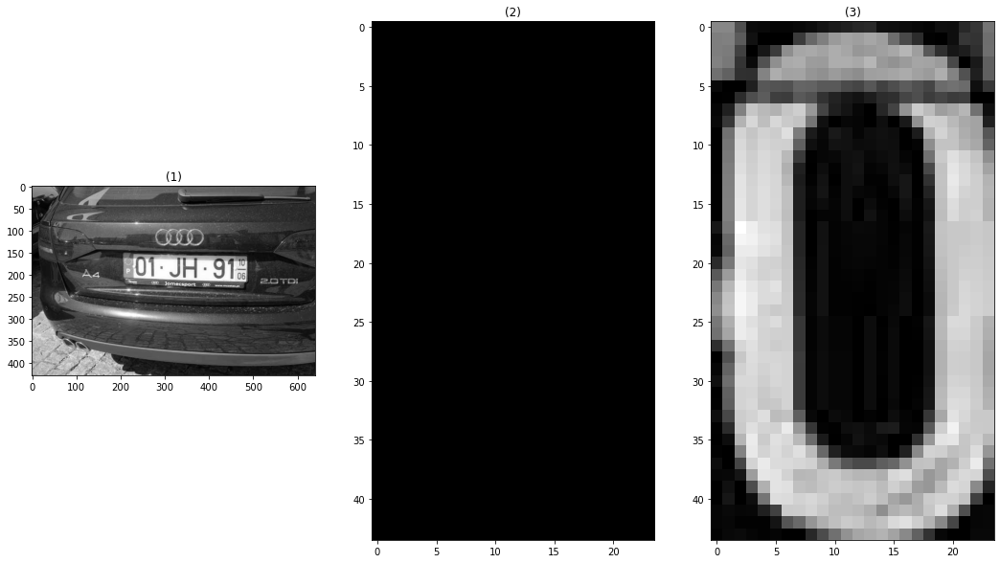

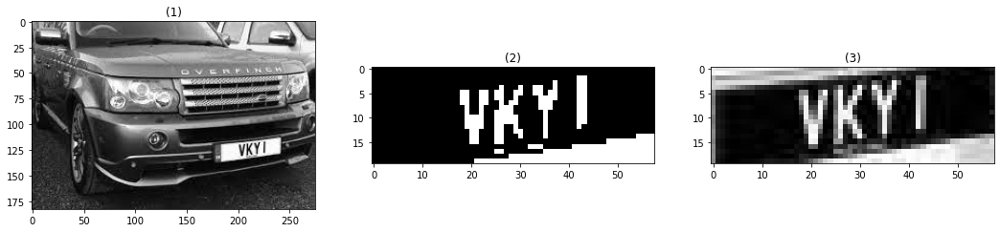

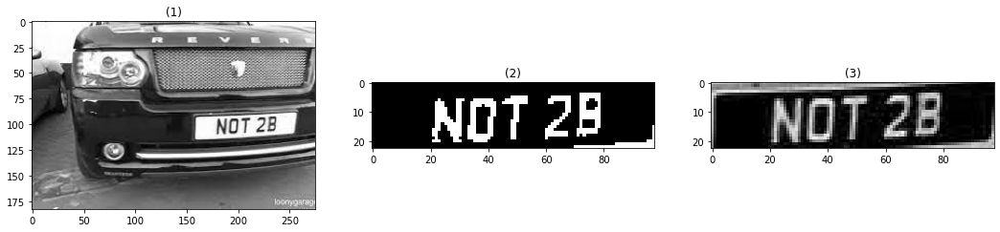

NOT 25,

NOT 2B ,



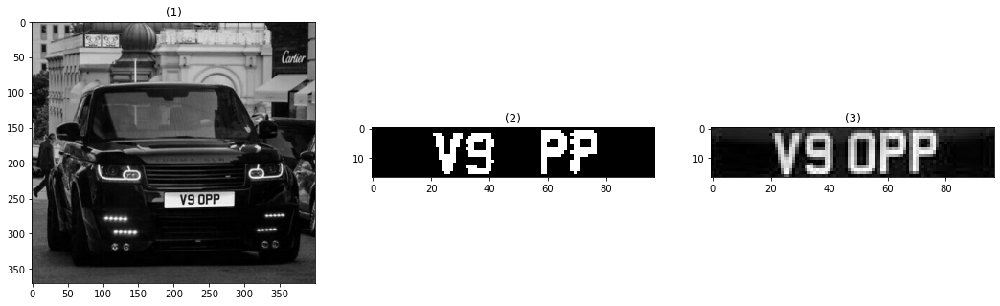

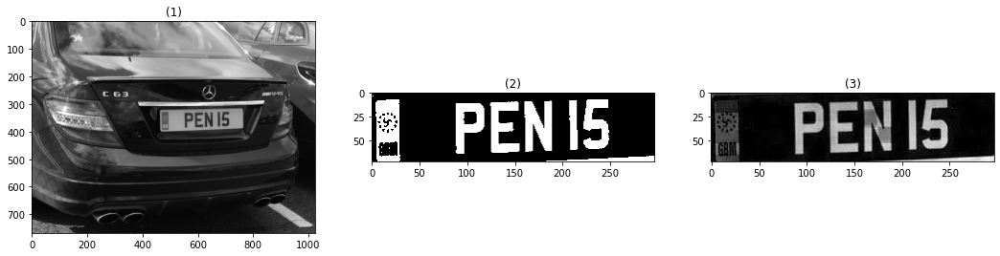

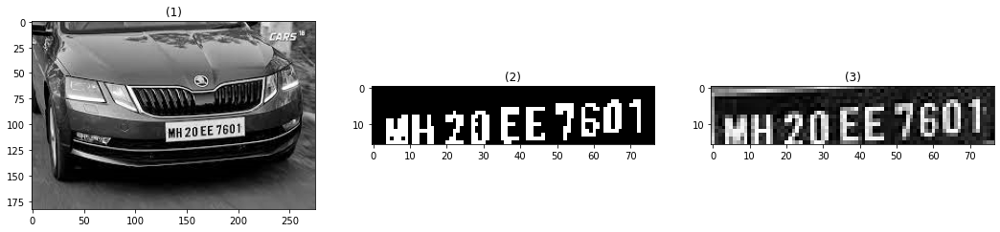

wH7OEE 7601

‘wu 90 EE 7601



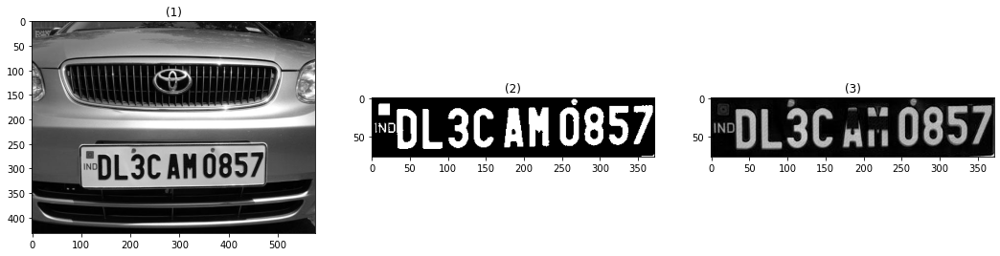


PL3C 411 0857



<ipython-input-7-555e34c025a1>:3: FutureWarning: Non RGB image conversion is now deprecated. For RGBA images, please use rgb2gray(rgba2rgb(rgb)) instead. In version 0.19, a ValueError will be raised if input image last dimension length is not 3.
  gray = np.asarray(rgb2gray(image))


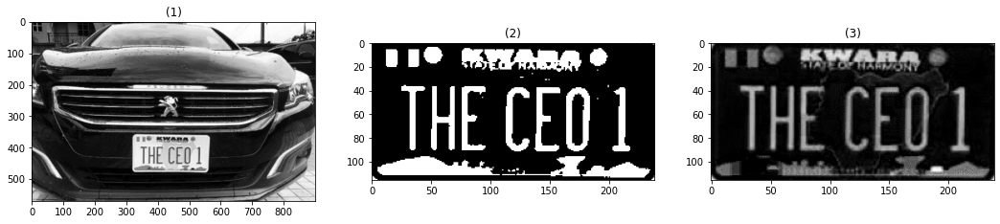


THE CED



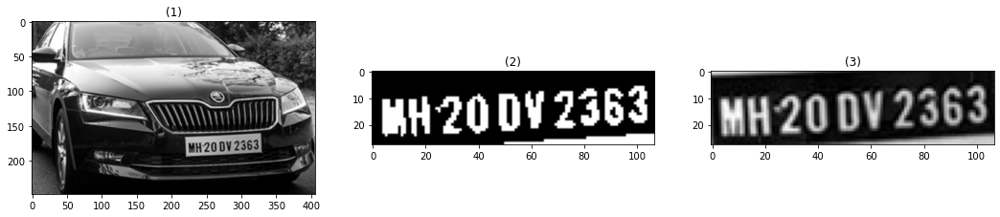

wH20D¥ 2363

MH20 DV 2363



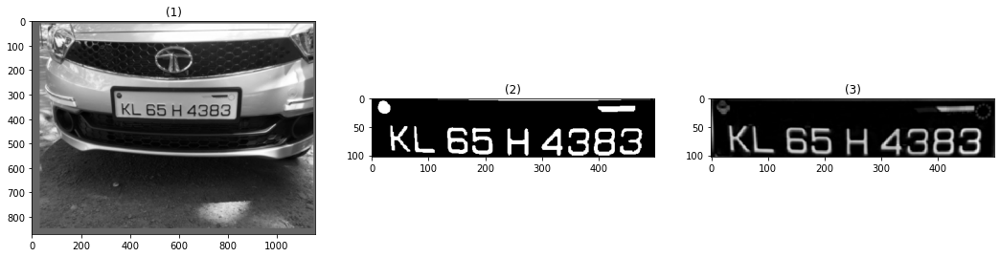

KL 65H4383

 

KL 85 44383



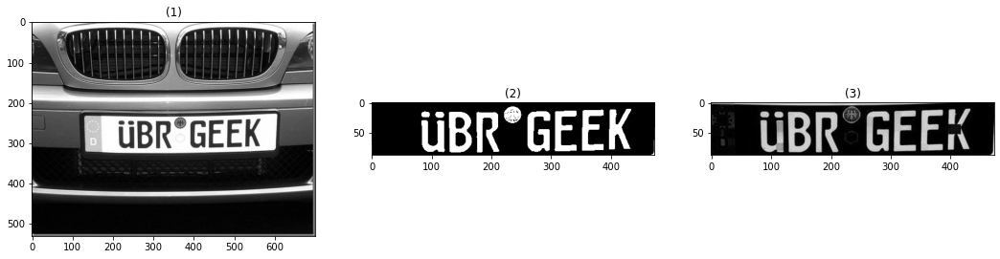

~ UBR°GEEK




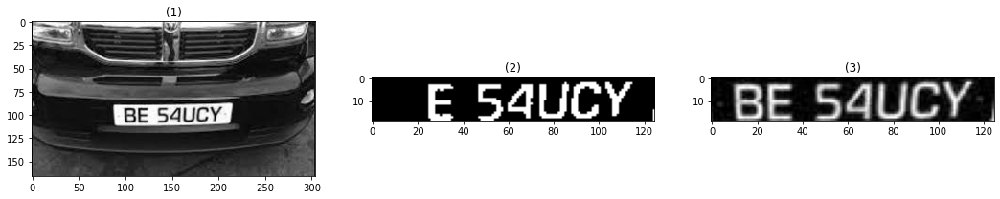

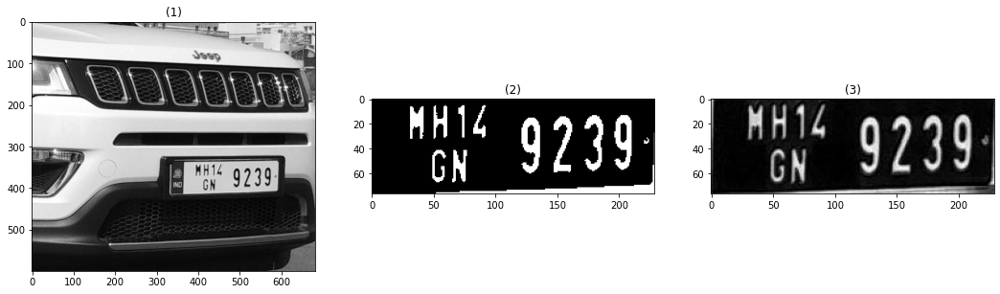

Mey 9239-

MEP 993):



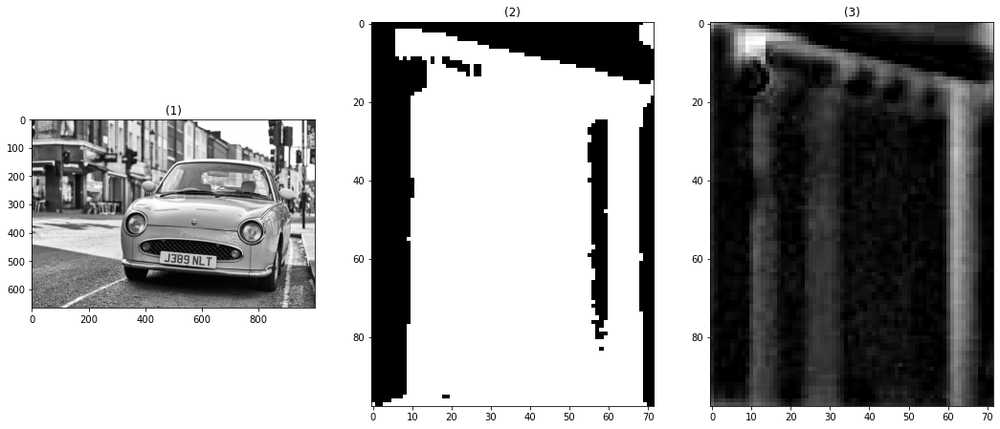

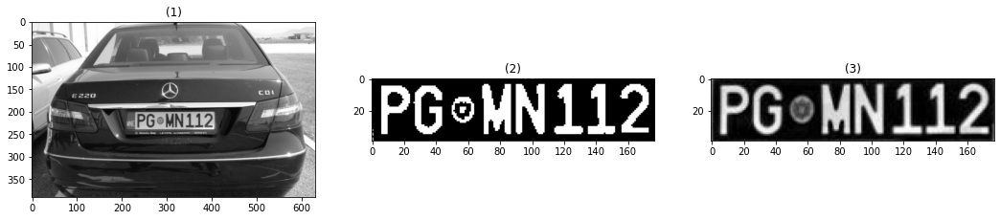


PGeMN112



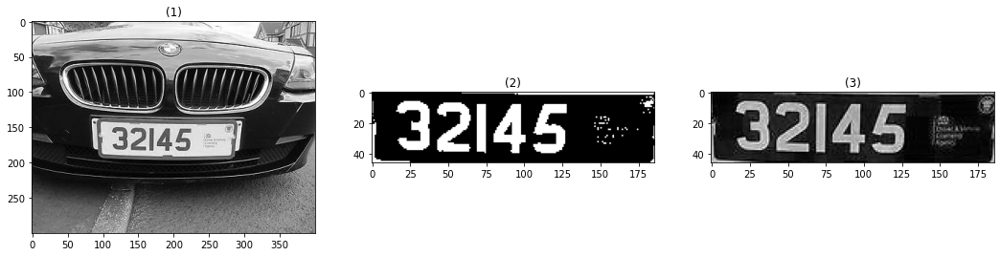

32145 =

32145 =



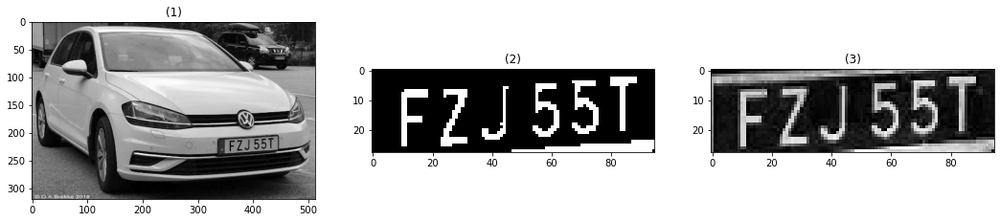

F7J 557.

FzJ 557



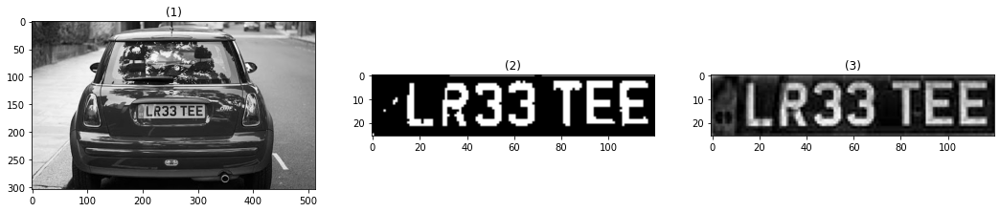

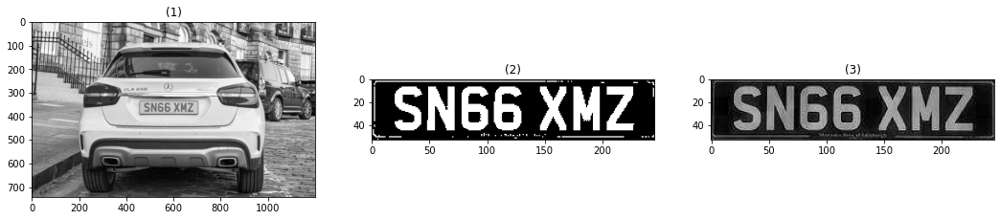

'SN66 XMZ




In [7]:
for imgName in sorted(glob.glob('C:/Users/Mazen/Desktop/image/Project/cars_dataset/*.jpg')):
    image = io.imread(imgName)
    gray = np.asarray(rgb2gray(image))
    imgFiltered = noiseReduction(gray)
    imgEnhanced = contrastEnhancement(imgFiltered)
    imgEdge = canny(imgEnhanced)
    imgPlate, _ = Plate_detection(imgEdge,gray,image)
    characters1 = characterSegmentation(imgPlate, "connectedComponents")
    characters2 = characterSegmentation(imgPlate, "blackHatMorphology")
    show_images([gray, characters1, characters2])
    pytesseract.pytesseract.tesseract_cmd = r'C:/Program Files/Tesseract-OCR/tesseract.exe'
    print(pytesseract.image_to_string(characters1))
    print(pytesseract.image_to_string(np.uint8(characters2 * 255)))

In [73]:
def plateExtraction(imgEdge, imgGray, imgRGB):
#     seBlackhat = cv2.getStructuringElement(cv2.MORPH_RECT, (13, 5))
    seClosing = np.ones((3,3))
#     imgBlackhat = cv2.morphologyEx(imgGray, cv2.MORPH_BLACKHAT, seBlackhat)
#     for i in range(0):
#         #imgClosing = cv2.morphologyEx(imgClosing, cv2.MORPH_CLOSE, seClosing)
#         imgDilation = binary_dilation(imgDilation, seClosing)
#     imgBinary = imgBlackhat.copy() * 255
#     imgBinary[imgBinary < 80] = 0
#     imgBinary[imgBinary >= 80] = 1
    imgDilation = imgEdge.copy()
    for i in range(9):
        imgDilation = binary_dilation(imgDilation, seClosing)
    keypoints = cv2.findContours(np.uint8(imgEdge), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    contours = imutils.grab_contours(keypoints)
    contours = sorted(contours, key=cv2.contourArea, reverse=True)[:10]
    location = None
    count = 0
    for contour in contours:
        approx = cv2.approxPolyDP(contour, 8, True)
        if len(approx) == 4:
            location = approx
            break
    if (location is None):
        return imgDilation, imgGray
    mask = np.zeros(imgGray.shape, np.uint8)
    new_image = cv2.drawContours(mask, [location], 0,255, -1)
    new_image = cv2.bitwise_and(imgRGB, imgRGB, mask=mask)
    return imgDilation, new_image
    # Performing OTSU threshold
#     ret, thresh1 = cv2.threshold(np.uint8(imgGray), 0, 255, cv2.THRESH_OTSU | cv2.THRESH_BINARY_INV)
#     # Specify structure shape and kernel size.
#     # Kernel size increases or decreases the area
#     # of the rectangle to be detected.
#     # A smaller value like (10, 10) will detect
#     # each word instead of a sentence.
#     rect_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (18, 18))
    
#     # Applying dilation on the threshold image
#     dilation = cv2.dilate(imgBinary, rect_kernel, iterations = 1)

#     # Finding contours
#     contours, hierarchy = cv2.findContours(np.uint8(dilation), cv2.RETR_EXTERNAL,
#                                                      cv2.CHAIN_APPROX_NONE)

#     # Creating a copy of image
#     im2 = imgRGB.copy()

#     # Looping through the identified contours
#     # Then rectangular part is cropped and passed on
#     # to pytesseract for extracting text from it
#     # Extracted text is then written into the text file
#     for cnt in contours:
#         x, y, w, h = cv2.boundingRect(cnt)

#         # Drawing a rectangle on copied image
#         rect = cv2.rectangle(im2, (x, y), (x + w, y + h), (0, 255, 0), 2)

#         # Cropping the text block for giving input to OCR
#         cropped = im2[y:y + h, x:x + w]
#         show_images([imgBinary, cropped])
        
        
        
#     contours = find_contours(imgBlackhat,0.8)
#     bounding_boxes = list()
#     for contour in contours:
#         minY = np.amin(contour, 0)[0]
#         maxY = np.amax(contour, 0)[0]
#         minX = np.amin(contour, 0)[1]
#         maxX = np.amax(contour, 0)[1]
#         bounding_boxes.append([int(minX), int(maxX), int(minY), int(maxY)])

#     img_with_boxes = np.zeros(imgBlackhat.shape)

#     #When provided with the correct format of the list of bounding_boxes, this section will set all pixels inside boxes in img_with_boxes
#     for box in bounding_boxes:
#         [Xmin, Xmax, Ymin, Ymax] = box
#         rr, cc = rectangle(start = (Ymin,Xmin), end = (Ymax,Xmax), shape=imgBlackhat.shape)
#         img_with_boxes[rr, cc] = 1 #set color white
#     imgWithAspect = img_with_boxes[200:280, :]
#     show_images([imgGray, img_with_boxes, imgWithAspect])
#     keypoints = cv2.findContours(np.uint8(imgDilation), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
#     contours = imutils.grab_contours(keypoints)
#     contours = sorted(contours, key=cv2.contourArea, reverse=True)[:10]
#     location = None
#     for contour in contours:
#         approx = cv2.approxPolyDP(contour, 10, True)
#         if len(approx) == 4:
#             location = approx
#             break
#     if (location is None):
#         return imgDilation, imgGray
#     mask = np.zeros(imgGray.shape, np.uint8)
#     new_image = cv2.drawContours(mask, [location], 0,255, -1)
#     new_image = cv2.bitwise_and(imgRGB, imgRGB, mask=mask)
#     return imgDilation, new_image